# **Université Sorbonne Université**
## **Master 2 - Ingénierie des Systèmes Intelligents**

### **Étudiant :** EMADALY Khouzema, DRO Marc

### **UE :** Traitement Avancé des Images

### **Date de réalisation :** Octobre-Novembre 2024

---

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.path.dirname('FeatureDetection'), '..')))
from src.fast import fast_detection, suppr_non_maxima
from src.harris import compute_harris_detector, display, harris_detector_image, non_maxima_suppression, red_circle
from src.descriptors import compute_matching_points, display_matching, matching_points_lbp, extract_lbp_descriptors, distance_metric_eucludian, extract_descriptors, display_patches

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from skimage import io
from skimage.transform import rotate
import pandas as pd
import seaborn as sns
from tqdm import tqdm

## 1) Harris Detector

In [2]:
image_name1 = "/Users/liamdro/PycharmProjects/FeatureDetection/images/P1.JPG"
image_name2 = "/Users/liamdro/PycharmProjects/FeatureDetection/images/P2.JPG"
sigma = 1 # std for gaussian windows
window_size = 3 # ponderation filter size
nms_window = 5 # non-maxima window size
k=0.055 # harris criteria
window_sizes = [3, 5, 7, 11, 13] # ponderation window sizes
ks = np.linspace(0.04, 0.06, 5) # table of k parameters

### (a) Implémenter le détecteur de Harris en utilisant une fenêtre de pondération rectangulaire puis gaussienne. (voir harris.py, fonction harris_detector)

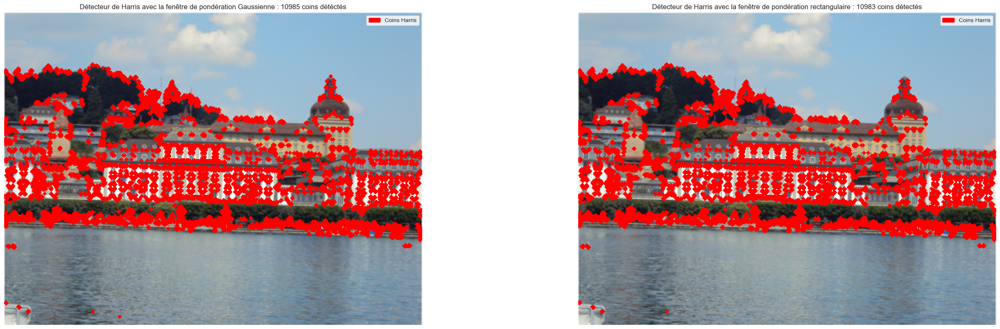

In [3]:
harris_gauss_image, numb_point_detec_gauss, _ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, nms = False)
harris_rect_image, numb_point_detec_rect, _ = compute_harris_detector(image_name1, window_type="Rectangular", window_size=window_size, k=k, nms=False)

#affichage
images = [[harris_gauss_image, harris_rect_image]]
titles = [[f"Détecteur de Harris avec la fenêtre de pondération Gaussienne : {numb_point_detec_gauss} coins détéctés", f"Détecteur de Harris avec la fenêtre de pondération rectangulaire : {numb_point_detec_rect} coins détectés"]]
display(images, titles)


### Interprétations : 

Nous pouvons voir que l’utilisation d’une fenêtre rectangulaire permet de détecter davantage de points, mais elle paraît moins précise avec des amas de points dans des zones texturées ou répétitives. À l’inverse, la fenêtre gaussienne détecte moins de coins, mais ceux-ci sont plus significatifs. Cependant nous pouvons tout de même voir des amas de points pour celui-ci aussi. 

### b. Implémenter également une suppression des non-maxima locaux afin d’éviter les ”amas” de points d’intérêt. (voir harris.py fonction suppression_maxima_locaux)

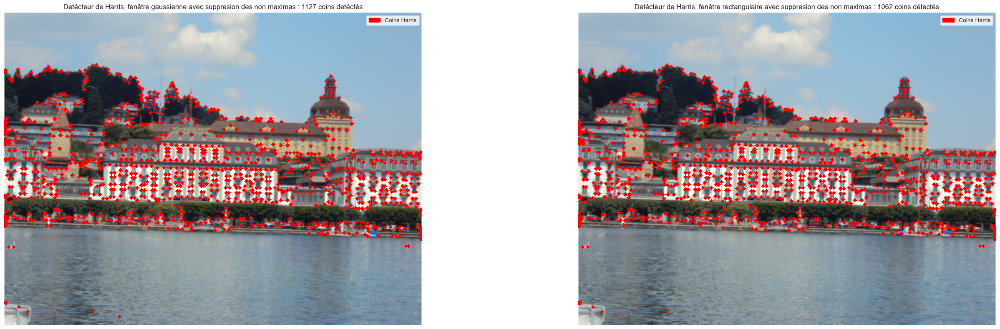

In [4]:
harris_gauss_image, numb_point_detec_gauss, _ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, nms=True, nms_window=nms_window)
harris_rect_image, numb_point_detec_rect, _ = compute_harris_detector(image_name1, window_type="Rectangular", window_size=window_size, k=k, nms=True, nms_window=nms_window)

# Display detection 
images = [[harris_gauss_image, harris_rect_image]]
titles = [[f"Detécteur de Harris, fenêtre gaussienne avec suppresion des non maximas : {numb_point_detec_gauss} coins detéctés", f"Detécteur de Harris, fenêtre rectangulaire avec suppresion des non maximas : {numb_point_detec_rect} coins détectés"]]
display(images, titles)

### Interprétations : 

La suppression des non-maxima locaux permet une réduction significative du nombre de points détectés. En effet, nous arricons à éliminer les coins redondants ou non pertinents, avec la fenêtre gaussienne et la fenêtre rectangumlaire.

### c. Etudier l’influence du type de fenêtre de pondération, de sa taille ainsi que du paramètre k dans la détection de point d’intérêt.

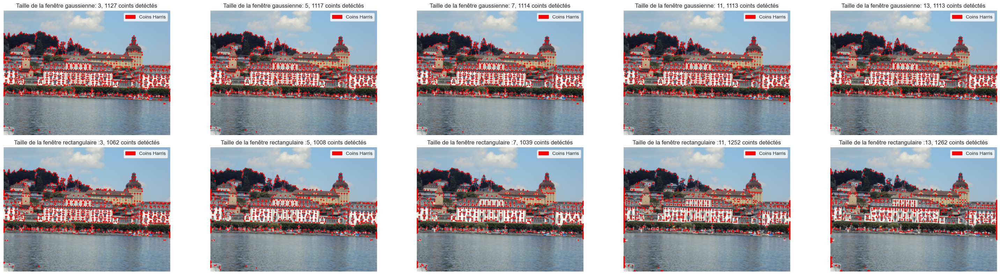

In [5]:
images_rect_step  = []
images_gauss_step = []
titles_rect_step = []
titles_gauss_step = []

for w in window_sizes:
    harris_gauss_image, numb_point_detec_gauss, _ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=w, k=k, sigma = sigma, nms_window=nms_window)
    harris_rect_image, numb_point_detec_rect, _ = compute_harris_detector(image_name1, window_type="Rectangular", window_size=w, k=k, nms_window=nms_window)

    images_rect_step.append(harris_rect_image)
    images_gauss_step.append(harris_gauss_image)
    titles_rect_step.append(f'Taille de la fenêtre rectangulaire :{w}, {numb_point_detec_rect} coints detéctés')
    titles_gauss_step.append(f'Taille de la fenêtre gaussienne: {w}, {numb_point_detec_gauss} coints detéctés')

images = [images_gauss_step, images_rect_step]
titles = [titles_gauss_step, titles_rect_step]
display(images, titles)

### Interprétations l’influence du type de fenêtre de pondération et de sa taille : 

- #### **Fenêtre rectangulaire :** 
L'augmentation de la taille de la fenêtre entraîne des variations incontrôlées du nombre de points détectés (augmentation ou diminution).
Cette observation est cohérente avec la pondération uniforme appliquée par la fenêtre rectangulaire, qui ne distingue pas entre les régions centrales et périphériques de la fenêtre. Une fenêtre plus grande intègre davantage d’informations locales, mais au détriment de la précision, rendant les coins détectés plus sensibles à des variations locales ou à des artefacts.

- #### **Fenêtre gaussienne :** 
L'augmentation de la taille de la fenêtre entraîne une diminution progressive du nombre de coins détectés, mais cela devient stable au-delà d'une certaine taille (environ 7 pixels)., dépendant de la résolution de l'image.
L'effet de la pondération gaussienne agit comme un lissage progressif, réduisant les petites variations locales pour ne conserver que les structures importantes de l'image. Lorsque la fenêtre atteint une taille suffisante pour couvrir ces structures, la détection devient stable, éliminant les points indésirables et réduisant le bruit autour des coins détectés.



Les fenêtres gaussiennes sont plus robustes et stables que les fenêtres rectangulaires. Elles permettent une détection plus précise et mieux ciblée en réduisant les réponses parasites, notamment sur les structures importantes de l'image. À l'inverse, les fenêtres rectangulaires manquent de robustesse et tendent à produire des détections bruitées, particulièrement sensibles aux variations locales et à la taille de la fenêtre. Ces caractéristiques font des fenêtres gaussiennes un choix plus adapté pour des applications nécessitant une détection fiable des coins.

### d. Utiliser les fonctions existantes de Matlab ou Python pour effectuer une rotation de l’image. Les points d’intérêt détectés sur cette image tournée sont-ils les mêmes que ceux de l’image originale? Quel paramètre faut-il adapter pour que cela soit le cas ?

In [6]:
def optim_rot(window_size = 3, k = 0.055, nms_window = 5, sigma = 1, angle = 60):
    # Apply Harris detector with Gaussian and rectangular windows
    harris_gauss_image, numb_point_detec_gauss,_ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma,  nms_window = nms_window, rotate = False)
    harris_gauss_image_rotated, numb_point_detec_gauss_rot,_ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, nms_window = nms_window, rotate = True, angle=angle)
    
    harris_rect_image, numb_point_detec_rect,_ = compute_harris_detector(image_name1, window_type="Rectangular", window_size=window_size, k=k, nms_window=nms_window)
    harris_rect_image_rotated, numb_point_detec_rect_rot,_ = compute_harris_detector(image_name1, window_type="Rectangular", window_size=window_size, k=k, rotate=True, nms_window=nms_window, angle=angle)


    # error number of point
    rectangular_abs_points = np.abs(numb_point_detec_rect - numb_point_detec_rect_rot)
    gauss_abs_points = np.abs(numb_point_detec_gauss -  numb_point_detec_gauss_rot)

    return [[harris_gauss_image, harris_gauss_image_rotated], [harris_rect_image, harris_rect_image_rotated]], [[f'Gaussian {numb_point_detec_gauss} points', f'Gaussian image rotated {angle} degree {numb_point_detec_gauss_rot} points'], [f"Rectangular {numb_point_detec_rect} points", f"Rectangular image rotated {angle} degree {numb_point_detec_rect_rot} points"]], rectangular_abs_points, gauss_abs_points

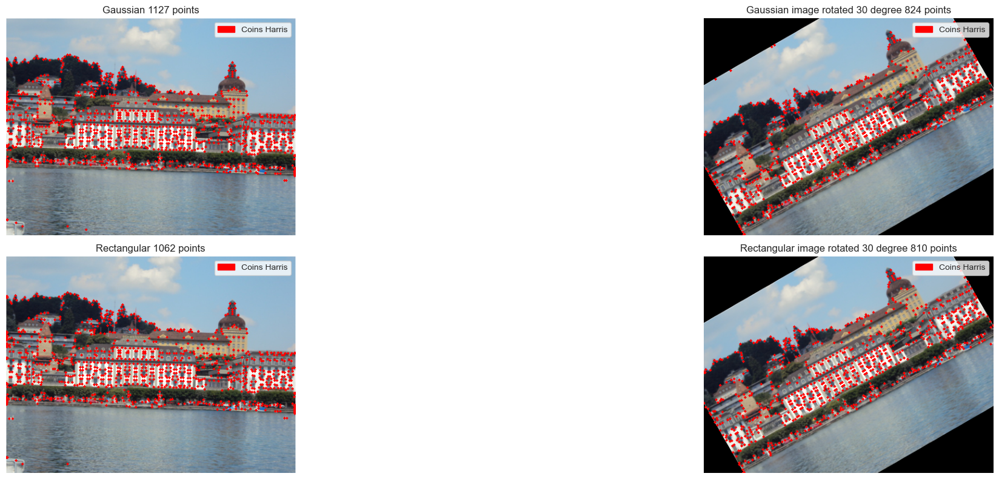

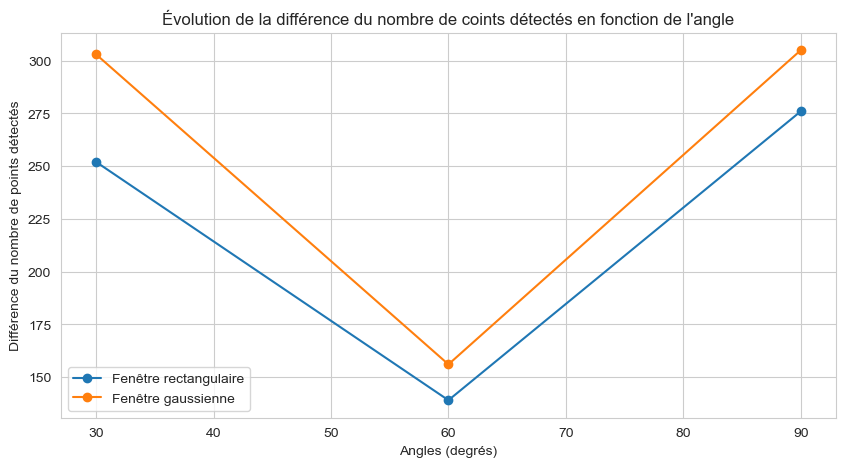

In [7]:
angles = [30, 60, 90] # np.linspace(30, 90, 3)
rectangular_errors = []
gaussian_errors = []
for i, ang in enumerate(angles):
    images, titles, rectangular_error, gaussian_error = optim_rot(angle=ang, sigma=sigma)
    rectangular_errors.append(rectangular_error)
    gaussian_errors.append(gaussian_error)
    if i == 0:
        display(images, titles)

plt.figure(figsize =(10, 5))
plt.plot(angles, rectangular_errors, 'o-', label = "Fenêtre rectangulaire")
plt.plot(angles, gaussian_errors, 'o-', label = "Fenêtre gaussienne")
plt.title("Évolution de la différence du nombre de coints détectés en fonction de l'angle")
plt.xlabel("Angles (degrés)")
plt.ylabel("Différence du nombre de points détectés")
plt.legend()
plt.show()

### Interprétations : 

Nous pouvons voir que les points d’intérêt détectés sur l’image tournée diffèrent de ceux détectés sur l’image originale. Cela reste vrai même avec la fenêtre gaussienne, qui pourtant devrait être invariante en rotation. Cette limitation s’explique par le fait que l'invariance en rotation est compromise par d'autres composants de l'algorithme de Harris, tels que le calcul des gradients, les seuils ou encore la réponse du détecteur lui-même, qui ne sont pas entièrement invariants à la rotation. Cela montre que, bien que la fenêtre gaussienne améliore la robustesse, l’invariance complète nécessite des modifications supplémentaires à d’autres étapes de l’algorithme.

## Quel paramètre faut-il adapter pour que cela soit le cas ?

In [8]:
def optim_rotation_param(window_size = 3, k = 0.055, nms_window = 5, nms = True, sigma = 1, angle = 30, threshold = 0.01):
    # Apply Harris detector with Gaussian and rectangular windows
    harris_gauss_image, numb_point_detec_gauss,_ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=3, k=0.055, sigma = 1, nms_window = 5, rotate = False)
    harris_gauss_image_rotated, numb_point_detec_gauss_rot,_ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, nms_window = nms_window, rotate = True, angle=angle, threshold = threshold)
    gauss_abs_points = np.abs(numb_point_detec_gauss -  numb_point_detec_gauss_rot)
    # print(numb_point_detec_gauss, numb_point_detec_gauss_rot)
    return gauss_abs_points  

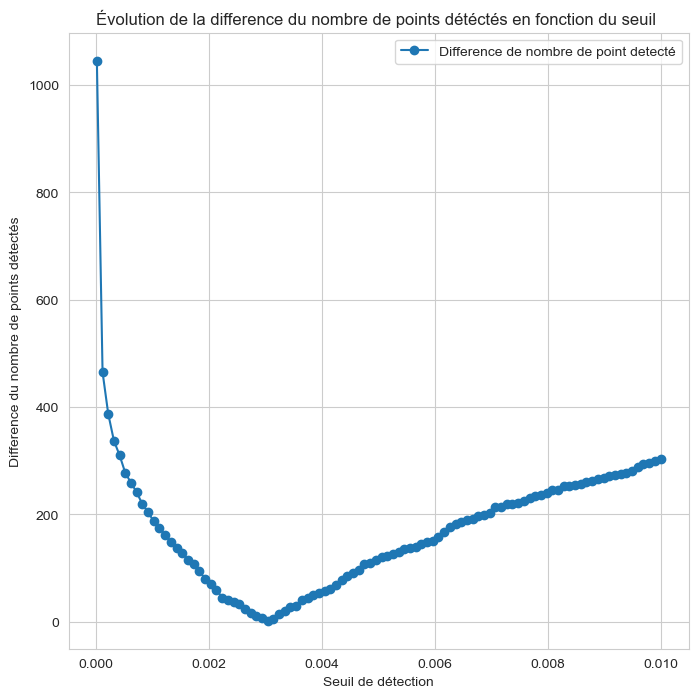

In [9]:
thresholds = np.linspace(1e-5, 1e-2, 100) # thresholds
gaussian_errors = []
for threshold in thresholds:
    gaussian_error = optim_rotation_param(angle=30, threshold=threshold)
    gaussian_errors.append(gaussian_error)

plt.figure(figsize =(8, 8))
plt.plot(thresholds, gaussian_errors, 'o-', label = "Difference de nombre de point detecté")
plt.title("Évolution de la difference du nombre de points détéctés en fonction du seuil ")
plt.xlabel("Seuil de détection")
plt.ylabel("Difference du nombre de points détectés")
plt.legend()
plt.show()

### Interprétations : 

Pour améliorer l'invariance en rotation, il est nécessaire d'adapter le seuil de détection des coins.
Un seuil plus élevé pour la réponse de coin restreint la détection aux coins ayant les scores les plus élevés, ce qui permet de se concentrer sur les points les plus significatifs. Toutefois, un seuil trop strict peut entraîner la perte de coins importants, notamment dans des images tournées, où la rotation peut atténuer la réponse des coins, même s'ils sont pertinents.

Dans notre cas, le seuil de départ était fixé à 0.01, mais pour l'image retournée, il était nécessaire de réduire ce seuil pour éviter d'ignorer des coins qui, bien que moins marqués après la rotation, restent significatifs. En diminuant le seuil, on accepte une plus grande gamme de réponses de coins, ce qui permet de conserver des points d'intérêt même si leur réponse est légèrement atténuée par la rotation. Cela permet de maintenir une détection cohérente entre l'image originale et l'image transformée.

## 2) Détecteur FAST

In [10]:
image_color = io.imread(image_name1)  # Remplacez par le chemin de votre image

In [11]:
# Paramètres
seuil_t = 9
n = 12 #n pixel consécutif pour le seuil
window_size = 3 #taille du voisinage pour la suppression des non-maxima

### (a) Implémenter le détecteur FAST.

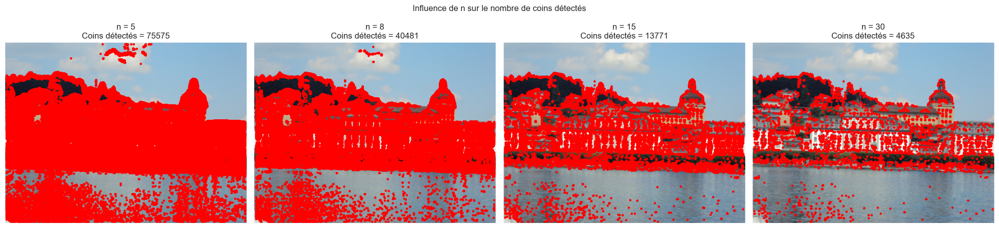

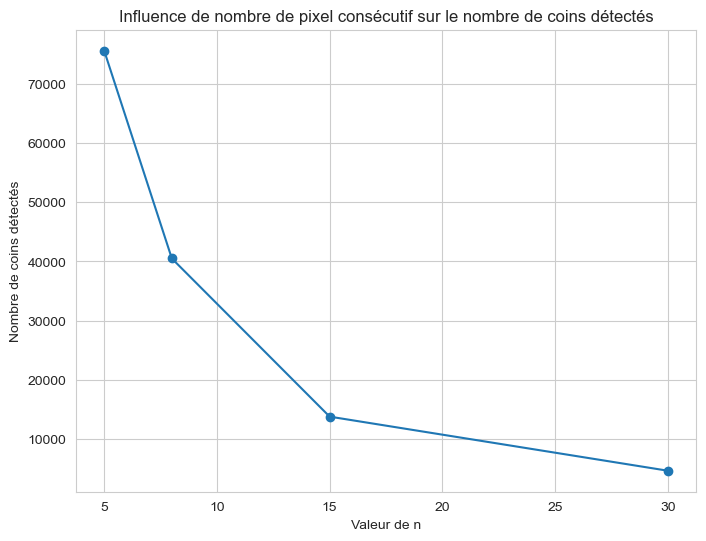

In [12]:
# Valeurs de n à tester
n_pixels = [5, 8, 15,30]
nombre_coins = []

# Création des sous-graphes pour afficher les images avec coins détectés
fig, axes = plt.subplots(1, len(n_pixels), figsize=(5 * len(n_pixels), 5))

for ax, n in zip(axes, n_pixels):
    # Détecter les coins avec le détecteur FAST
    coins, _ = fast_detection(image_color, n, seuil_t)
    nombre_coins.append(len(coins))
    
    # Afficher l'image et les coins détectés
    ax.imshow(image_color)
    if coins:
        y_coords, x_coords = zip(*coins)
        ax.scatter(x_coords, y_coords, c='r', s=5)
    ax.set_title(f'n = {n}\nCoins détectés = {len(coins)}')
    ax.axis('off')

plt.suptitle('Influence de n sur le nombre de coins détectés')
plt.tight_layout()
plt.show()

# Tracer l'évolution du nombre de coins détectés en fonction de n
plt.figure(figsize=(8, 6))
plt.plot(n_pixels, nombre_coins, marker='o')
plt.xlabel('Valeur de n')
plt.ylabel('Nombre de coins détectés')
plt.title('Influence de nombre de pixel consécutif sur le nombre de coins détectés')
plt.grid(True)
plt.show()

### Interprétations : 

Pour commencer, nous avons essayé de prendre un nombre_pixel_N inférieur à celui conseillé dans le cours (que **nombre_pixel_N > 8**). 

- **Avec nombre_pixel_N = 5** :
  Il suffit que 5 pixels consécutifs dans le cercle soient plus clairs ou plus sombres que le seuil. Ceci entraîne la détection de plus de coins. Ici on a plus de 58000 coins détectés.

- **Avec nombre_pixel_N = 8** :
  En augmentant nombre_pixel_N, la condition devient plus stricte. Ce qui réduit le nombre de coins détectés. Donc on a moins de coins dans les zones moins distinctes et qui ne sont pas suceptibles d'être des coins. Et ça garde les coins jugés plus importants. Ici on a divisé le nombre de coins d'environs 2.

- **Avec nombre_pixel_N = 30** :
  Très peu de coins sont détectés, car même si la condition s'est deux fois plu strictifiée, nous avons aussi dépassé le nombre de pixel consécutif à chercher. Ene effet, si nous prenons en consiérations 16 pixels aux alentours, il serait inutile de chercher plus de 16 pixels consécutifs car nous repasserons sur les mêmes points, et ce qui fait que la crière de selection sera trop strcite.


Ceci est illustré sur le graphique sur l'influence du seuil sur quantité fixé du nombre de pixel consécutif. Plus nombre_pixel_N est grand, plus le nombre de coins détectés est petit, jusqu'à ce qu'à un moment on détecte un même nombre de coins à l'infini. Donc En augmentant nombre_pixel_N, l'algorithme devient plus sélectif.

### (b) Implémenter la suppression des non-maxima locaux

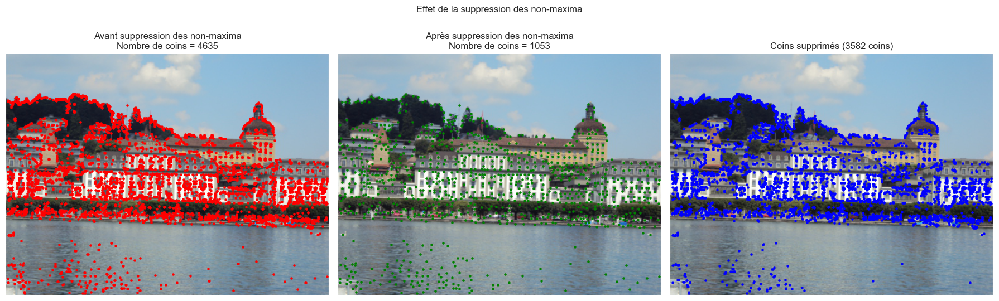

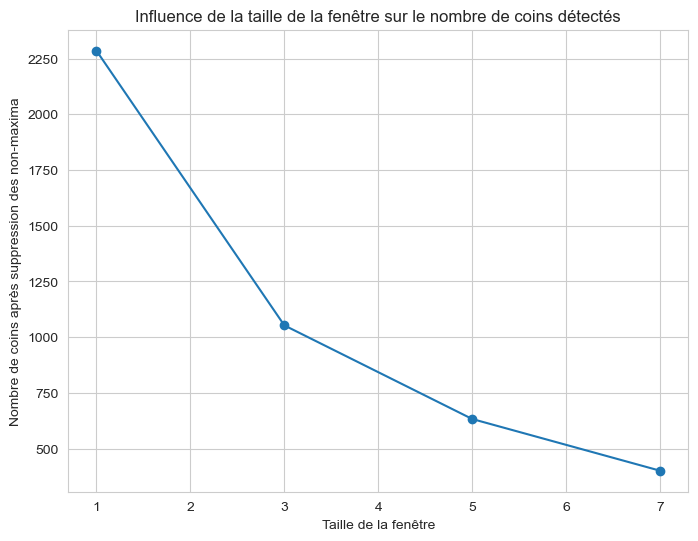

In [13]:
#coins sans suppression des non-maxima
coins, scores = fast_detection(image_color, n, seuil_t)

coins_NMS, _ = suppr_non_maxima(
    coins, scores, image_color.shape[:2], window_size)

# On obtient les coins supprimés en convertissant les listes avant suppressions en un ensemble
set_coins = set(coins) 
set_coins_supprimes = set(coins_NMS)
coins_supprimes = list(set_coins - set_coins_supprimes)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

#on affiche image avant suppression des non-maxima
axes[0].imshow(image_color)
axes[0].scatter([x for y, x in coins], [y for y, x in coins], c='r', s=5)
axes[0].set_title(f'Avant suppression des non-maxima\nNombre de coins = {len(coins)}')
axes[0].axis('off')

#après suppression des non-maxima
axes[1].imshow(image_color)
axes[1].scatter([x for y, x in coins_NMS], [y for y, x in coins_NMS], c='g', s=5)
axes[1].set_title(f'Après suppression des non-maxima\nNombre de coins = {len(coins_NMS)}')
axes[1].axis('off')

#différence des 2
axes[2].imshow(image_color)
axes[2].scatter([x for y, x in coins_supprimes], [y for y, x in coins_supprimes], c='b', s=5)
axes[2].set_title(f'Coins supprimés ({len(coins_supprimes)} coins)')
axes[2].axis('off')

plt.suptitle('Effet de la suppression des non-maxima')
plt.tight_layout()
plt.show()

######################################################################################################

#différentes tailles de fenêtre
windows = [1, 3, 5, 7]
nombre_coins_apres_suppression = []

for w in windows:
    coins_sup, _ = suppr_non_maxima(
        coins, scores, image_color.shape[:2], w)
    nombre_coins_apres_suppression.append(len(coins_sup))

plt.figure(figsize=(8, 6))
plt.plot(windows, nombre_coins_apres_suppression, marker='o')
plt.xlabel('Taille de la fenêtre')
plt.ylabel('Nombre de coins après suppression des non-maxima')
plt.title('Influence de la taille de la fenêtre sur le nombre de coins détectés')
plt.grid(True)
plt.show()


### Interprétations : 

- **Avant supression des non-maxima** :
  On a vu précedemment qu'avec un nombre de pixel n élevé on a un grand nombre de coins, inutiles et incorrecte parfois, qui sont détectés. Cela introduit de la redondance dans la détection.

- **Après supression des non-maxima** :
  On considère maintenant une fenêtre pour filtrer les coins. On peut remarquer que ça réduit le nombre de coins. On a donc réussi à éliminer les doublons, et conserver que les points significatifs. Donc a amélioré la précision de la détection.

La suppression des non-maxima nous a donc permis de garder uniquement les coins les plus significatifs et la distance choisi peut être ajustée pour obtenir un compromis entre précision et densité des coins.

**Le score utilisé pour la suppression des non-maxima dans FAST est basé sur le nombre de pixels consécutifs dans le cercle de 16 voisins autour du pixel central qui sont soit beaucoup plus clairs, soit beaucoup plus sombres que le pixel central I(p0) 
selon un seuil_t.**

### (c) Effet de la rotation de l'image sur les coins détectés sur l'image originale

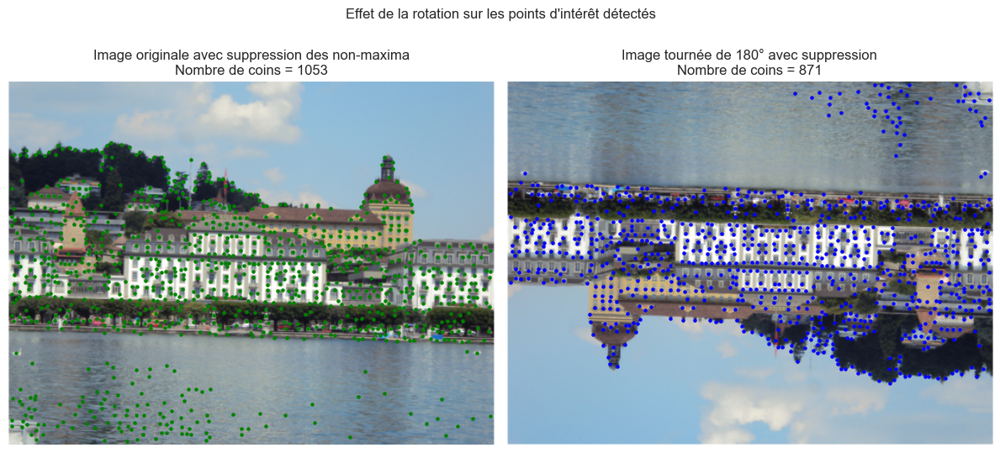

In [14]:
#detections sur l'image originale
coins, scores = fast_detection(image_color, n, seuil_t)

#suppression des non-maxima sur l'image originale
coins_NMS, _ = suppr_non_maxima(
    coins, scores, image_color.shape[:2], window_size)

#rotation de l'image
angle = 180
image_rot = rotate(image_color, angle, resize=True, mode='edge')
image_rot = (image_rot * 255).astype(np.uint8)

#on detecte les coins sur l'image tournée
coins_rot, scores_rot = fast_detection(image_rot, n=12, seuil_t=20)

#suppression des non-maxima sur l'image tournée
coins_NMS_rot, _ = suppr_non_maxima(
    coins_rot, scores_rot, image_rot.shape[:2], window_size)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

#image avec suppression des non-maxima
axes[0].imshow(image_color)
axes[0].scatter([x for y, x in coins_NMS], [y for y, x in coins_NMS], c='g', s=5)
axes[0].set_title(f'Image originale avec suppression des non-maxima\nNombre de coins = {len(coins_NMS)}')
axes[0].axis('off')

#image tournée avec suppression des non-maxima
axes[1].imshow(image_rot)
axes[1].scatter([x for y, x in coins_NMS_rot], [y for y, x in coins_NMS_rot], c='b', s=5)
axes[1].set_title(f'Image tournée de {angle}° avec suppression\nNombre de coins = {len(coins_NMS_rot)}')
axes[1].axis('off')

plt.suptitle('Effet de la rotation sur les points d\'intérêt détectés')
plt.tight_layout()
plt.show()


### Interprétations : 

Nous pouvons remarquer que les points d’intérêt détectés sur l’image tournée ne sont pas identiques à ceux de l’image originale, ni en termes de nombre (1041 vs 879) ni en termes de position. Nous supposons que c'est à cause de la sensibilité de l’algorithme FAST à l’orientation. En effet, il utilise un motif circulaire pour détecter les coins. Pour rendre les coins détectés plus similaires entre l’image originale et l’image tournée il faut probablement ajuster le seuil_t pour qu’il soit plus faible, ce qui rend la détection plus tolérante, et d’augmenter la taille de la fenêtre pour la suppression des non-maxima pour regrouper plus de coins voisins.

## 3) Comparaisons

### a) Comparaison entre le detécteur de Harris et FAST

##### A partir de l'étude des 2 détecteur, en l'occurance le détecteur Harris et le détecteur FAST, nous pouvons dire que Harris détecte généralement plus de coins, en particulier dans les régions riches en textures complexes. En revanche, FAST détecte moins de coins, car il se concentre sur des motifs circulaires simples, ce qui le rend moins performant dans les zones très texturées. Théoriquement Harris devrait être insensible à l’orientation des motifs, tandis que FAST est sensible à l’orientation en raison de sa dépendance aux comparaisons de pixels dans un cercle autour du pixel central. Enfin, nous avons aussi remarqué que FAST est nettement plus rapide que Harris, ce qui le rend adapté aux applications en temps réel, tandis que Harris est plus précis mais plus coûteux en termes de calcul.

### b) Comparaison avec les fonctions existantes

### **Pour Harris :**

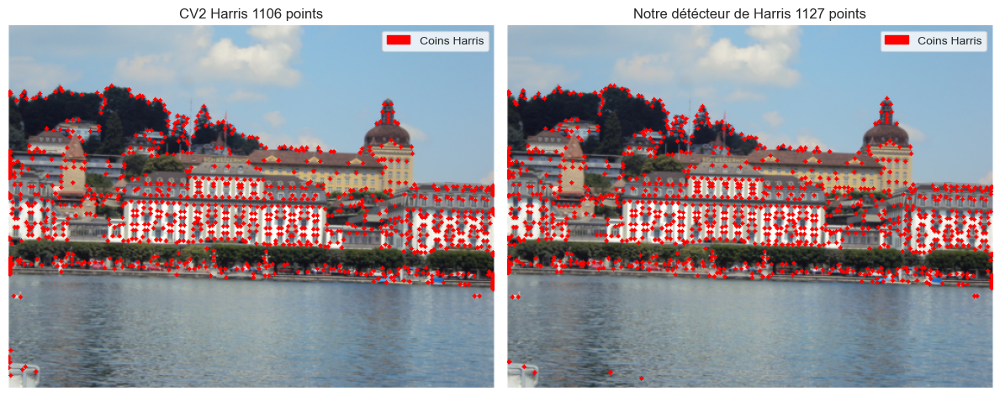

In [15]:
image = cv2.imread(image_name1, cv2.IMREAD_GRAYSCALE)
score = cv2.cornerHarris(image, window_size, 3, k)
score = non_maxima_suppression(score, window_size=nms_window)
corners = (score > 0.01 * score.max())

harris_image_cv2_harris, numb_point_detec_gauss_cv2, _ = harris_detector_image(image_name1, corners)
harris_gauss_image, numb_point_detec_gauss, _ = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, nms_window = nms_window)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(harris_image_cv2_harris)
axes[0].set_title(f'CV2 Harris {numb_point_detec_gauss_cv2} points', fontsize=12)
axes[0].legend(handles=red_circle, loc='upper right')
axes[0].axis("off")

axes[1].imshow(harris_gauss_image)
axes[1].set_title(f'Notre détécteur de Harris {numb_point_detec_gauss} points', fontsize=12)
axes[1].legend(handles=red_circle, loc='upper right')
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Interprétations : 

Nous pouvons remarquer que nous nous rapprochons assez bien des résultats obtenus avec OpenCV, tout en détectant légèrement plus de coins (1127 contre 1106). Notre implémentation se distingue particulièrement dans les zones riches en détails, comme les fenêtres et les feuillages, grâce à une sensibilité accrue permise par la pondération gaussienne. Cependant, cette sensibilité supplémentaire peut parfois introduire des faux positifs, là où OpenCV offre une détection légèrement moins sensible mais plus robuste et optimisée.


### **Pour FAST :**

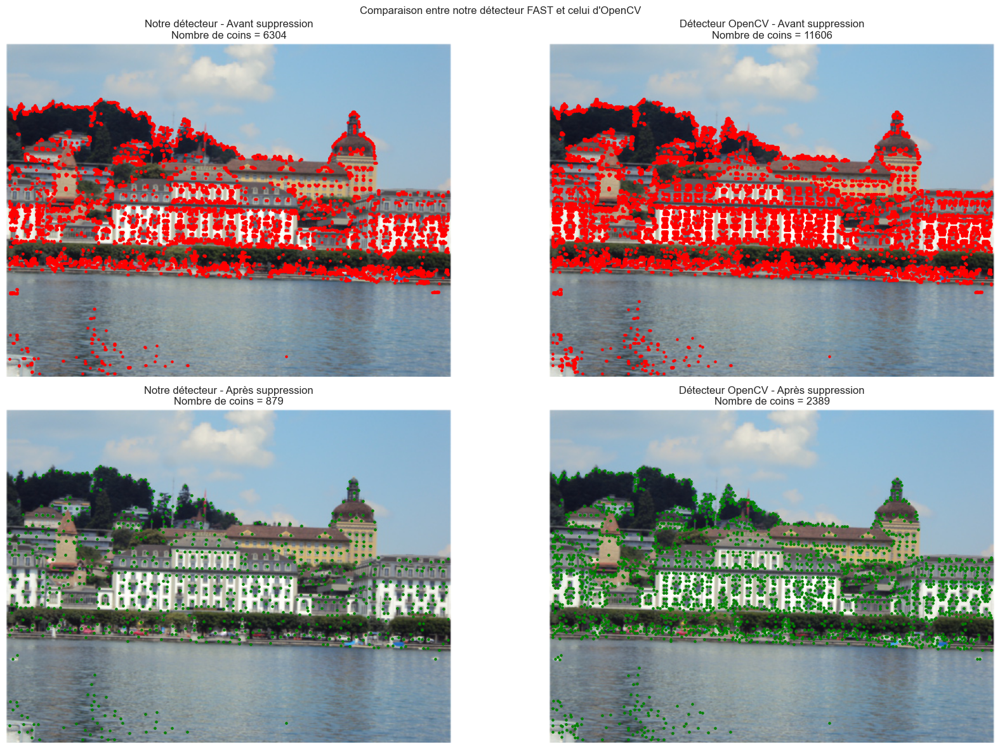

In [16]:
coins, scores = fast_detection(image_color, n=12, seuil_t=20)

coins_NMS, _ = suppr_non_maxima(
    coins, scores, image_color.shape[:2], window_size)

#image en niveaux de gris pour OpenCV
image_gray_cv = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

#FAST d'OpenCV
fast_cv = cv2.FastFeatureDetector_create()
fast_cv.setThreshold(20)  # Augmenter le seuil pour réduire le nombre de coins
fast_cv.setNonmaxSuppression(False)

#OpenCV sans suppression des non-maxima
keypoints_cv = fast_cv.detect(image_gray_cv, None)
coins_cv = [kp.pt for kp in keypoints_cv]
nombre_coins_cv = len(coins_cv)

#OpenCV avec suppression des non-maxima
fast_cv.setNonmaxSuppression(True)
keypoints_cv_suppressed = fast_cv.detect(image_gray_cv, None)
coins_cv_NMS = [kp.pt for kp in keypoints_cv_suppressed]
nombre_coins_cv_suppressed = len(coins_cv_NMS)

##################################################################################################################

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].imshow(image_color)
axes[0, 0].scatter([x for y, x in coins], [y for y, x in coins], c='r', s=5)
axes[0, 0].set_title(f'Notre détecteur - Avant suppression\nNombre de coins = {len(coins)}')
axes[0, 0].axis('off')

axes[0, 1].imshow(image_color)
axes[0, 1].scatter([pt[0] for pt in coins_cv], [pt[1] for pt in coins_cv], c='r', s=5)
axes[0, 1].set_title(f'Détecteur OpenCV - Avant suppression\nNombre de coins = {nombre_coins_cv}')
axes[0, 1].axis('off')

axes[1, 0].imshow(image_color)
axes[1, 0].scatter([x for y, x in coins_NMS], [y for y, x in coins_NMS], c='g', s=5)
axes[1, 0].set_title(f'Notre détecteur - Après suppression\nNombre de coins = {len(coins_NMS)}')
axes[1, 0].axis('off')

axes[1, 1].imshow(image_color)
axes[1, 1].scatter([pt[0] for pt in coins_cv_NMS], [pt[1] for pt in coins_cv_NMS], c='g', s=5)
axes[1, 1].set_title(f'Détecteur OpenCV - Après suppression\nNombre de coins = {nombre_coins_cv_suppressed}')
axes[1, 1].axis('off')

plt.suptitle('Comparaison entre notre détecteur FAST et celui d\'OpenCV')
plt.tight_layout()
plt.show()


### **Interprétations :**

Nous pouvons voir que notre detecteur FAST conserve moins de coins tandis que le détecteur d'OpenCV est plus sensible et détecte davantage de coins, mais conserve également plus de points redondants ou bruités après suppression. Cependant, le seuil est ajustable pour avoir une détection de point bien meilleur pour la détection avec openCV. 


## Exercice 2 : DESCRIPTION ET MATCHINGS DES POINTS D’INTÉRÊT

## 1) Description simple

In [17]:
# Paramètres pour Harris 
desc_window = 11 # taille de la fenetre 
nbp = 10 # nombre de points match a afficher 
r = 2
# Apply Harris detector 
harris_image1, numb_point1, points1 = compute_harris_detector(image_name1, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, r=r, nms_window=nms_window)
harris_image2, numb_point2, points2 = compute_harris_detector(image_name2, window_type="Gaussian", window_size=window_size, k=k, sigma = sigma, r=r, nms_window=nms_window)

### 1) a. Extraction des blocs de pixels autour des points d'intérêt

Nombre de descripteurs extraits dans l'image 1 : 1102
Nombre de descripteurs extraits dans l'image 2 : 1003


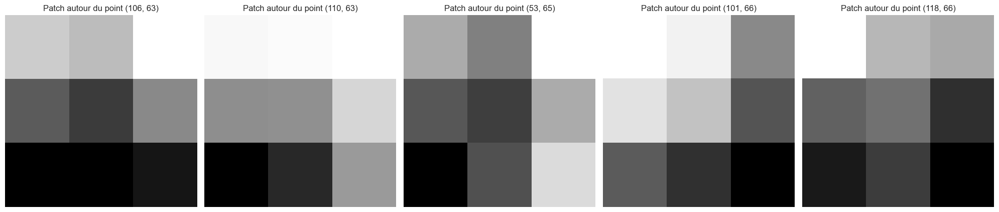

In [18]:
image1 = cv2.imread(image_name1, cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)

#on extrait des descripteurs pour chaque image
descriptors1, keypoints1 = extract_descriptors(image1, points1, window_size)
descriptors2, keypoints2 = extract_descriptors(image2, points2, window_size)

print(f"Nombre de descripteurs extraits dans l'image 1 : {len(descriptors1)}")
print(f"Nombre de descripteurs extraits dans l'image 2 : {len(descriptors2)}")

display_patches(image1, keypoints1, window_size)


 Nous pouvons voir que à partir de l'image 1 et l'image 2, nous avons respectivement 967 et 781 descripteur, pour le jeu de paramètre chosi. C'est-à-dire qu'autour de chaque point d'intérêt détecté dans l'exercice précédent, un bloc de pixel carré de taille fixe (window_size) a été extrait. Chaque bloc est transformé en vecteur en aplatissant les intensités des pixels. Nous illustrons cela avec des exemples de blocs de pixels extraits. 


### 1. b. Implémentation d'une Méthode de Matching

Computing distance: 1027it [00:02, 398.95it/s]


Nombre de correspondances trouvées : 54


Displaying: 100%|██████████| 10/10 [00:00<00:00, 3719.01it/s]


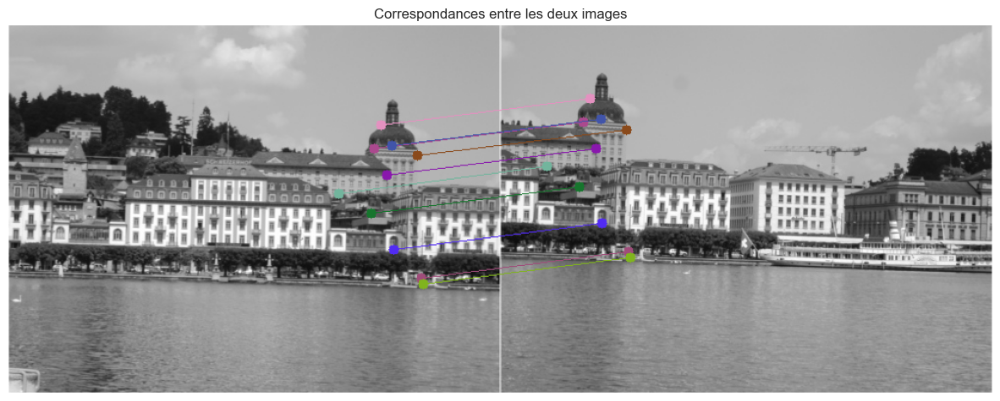

In [19]:
matches, convert_points1, convert_points2 = compute_matching_points(image1, image2, points1, points2, windows_size = desc_window, metric=distance_metric_eucludian)
nbp = len(matches)
print(f"Nombre de correspondances trouvées : {nbp}")
nb = 10 #nombre de points match a afficher 
# Affichage des correspondances entre les deux images
canvas = display_matching(image1, image2, convert_points1, convert_points2, matches, nb)
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.title('Correspondances entre les deux images')
plt.axis('off')
plt.show()

### Interprétations : 

Nous avons implémenté une méthode de matching des descripteurs en utilisant la distance euclidienne comme métrique de similarité. Les descripteurs qu'on a extrait précédemment ont été comparé, et les correspondances minimisant cette distance ont été retenues. Il faut vérifier que si un point de l’image 1 correspond à un point de l’image 2, alors ce dernier doit également correspondre au point initial. Cela permet d’éliminer certaines correspondances incohérentes.

Au total, 54 correspondances ont été trouvées entre les deux images. (c'est loin d'être parfait mais ceci nous permet de dire que notre matching fonctionne). Nous visualisons cela et nous voyons que que la majorité d’entre elles semblent correctes, alignant des structures similaires entre les deux images, bien que quelques mauvais appariements sont faites. 


### 1. c. Étude de l'Influence de la Taille du Bloc et des Métriques

Computing distance: 1051it [00:02, 393.30it/s]
Displaying: 100%|██████████| 32/32 [00:00<00:00, 41234.33it/s]
Computing distance: 1032it [00:02, 399.19it/s]
Displaying: 100%|██████████| 46/46 [00:00<00:00, 64355.57it/s]
Computing distance: 1027it [00:02, 398.69it/s]
Displaying: 100%|██████████| 54/54 [00:00<00:00, 65460.24it/s]
Computing distance: 1021it [00:02, 403.47it/s]
Displaying: 100%|██████████| 54/54 [00:00<00:00, 73776.03it/s]


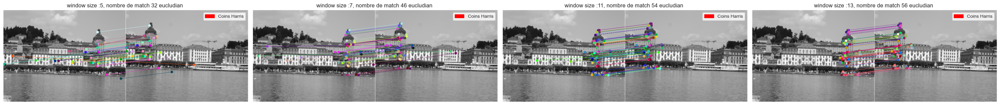

In [20]:
images_euc_step  = []
titles_euc_step = []

desc_windows = [5, 7, 11, 13] # descripteur window sizes

for desc_w in desc_windows:
    matches_eucli, convert_points1_eucli, convert_points2_eucli = compute_matching_points(image1, image2, points1, points2, windows_size = desc_w, metric=distance_metric_eucludian)
    canvas_eucli = display_matching(image1, image2, convert_points1_eucli, convert_points2_eucli, matches_eucli, nbp=nbp)
    images_euc_step.append(canvas_eucli)
    titles_euc_step.append(f'window size :{desc_w}, nombre de match {len(matches_eucli)} eucludian ')

images = [images_euc_step]
titles = [titles_euc_step]
display(images, titles)

### Interprétations : 

Nous avons testé 3 métriques : la distance euclidienne, la corrélation, et la corrélation normalisée sur différentes tailles de blocs (3x3, 5x5, 7x7 et 9x9). 

Nous pouvons tout de suite remarquer que la taille du bloc joue un rôle crucial : une petite taille de bloc (3x3) produit généralement le plus grand nombre de correspondances pour toutes les métriques, mais peut aussi inclure plus de mauvais appariements en raison de la faible quantité d'information locale. Plus la taille du bloc augmente plus le nombre de correspondances diminue. En effet, des blocs plus grands intègrent plus de contexte, permettant de mieux discriminer les points d'intérêt mais mène à une diminution de la densité des points détectés.

En ce qui concerne les métriques, la corrélation normalisée semble être la plus restrictive, produisant moins de correspondances, mais potentiellement plus robustes, car elle est insensible aux variations globales d'intensité. À l'inverse, la distance euclidienne génère davantage de correspondances, mais peut être plus sensible au bruit et aux variations d'échelle d'intensité. La corrélation, sans normalisation, offre un compromis intermédiaire, mais reste moins robuste que sa version normalisée. 

## 2) Description avancée

In [21]:
# Chargement des images en niveaux de gris
image1 = cv2.imread(image_name1, cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread(image_name2, cv2.IMREAD_GRAYSCALE)

In [22]:
# Paramètres
seuil_t = 20
n = 12 #n pixel consécutif pour le seuil
window_size = 3 #taille du voisinage pour la suppression des non-maxima

In [23]:
### Point d'intérêt détectés avec le détecteur FAST
#détection image 1
corners1, scores1 = fast_detection(image1, n, seuil_t)
corners1_nms, scores1_nms = suppr_non_maxima(corners1, scores1, image1.shape[:2], window_size)
points1 = [(x, y) for y, x in corners1_nms]  # Inversion x et y pour correspondre au format (x, y)

#détection image 2
corners2, scores2 = fast_detection(image2)
corners2_nms, scores2_nms = suppr_non_maxima(corners2, scores2, image2.shape[:2], window_size)
points2 = [(x, y) for y, x in corners2_nms]

### a. Implémenter le descripteur LBP et le combiner à votre descripteur FAST

In [24]:
#extraction des descripteurs LBP dans l'image 1
descriptors1_lbp, keypoints1_lbp = extract_lbp_descriptors(image1, points1, window_size, n)
#descripteurs LBP dans l'image 2
descriptors2_lbp, keypoints2_lbp = extract_lbp_descriptors(image2, points2, window_size, n)
print(f"Nombre de descripteurs LBP extraits dans l'image 1 : {len(descriptors1_lbp)}")
print(f"Nombre de descripteurs LBP extraits dans l'image 2 : {len(descriptors2_lbp)}")

Nombre de descripteurs LBP extraits dans l'image 1 : 883
Nombre de descripteurs LBP extraits dans l'image 2 : 712


In [25]:
#matching des descripteurs LBP
matches_lbp = matching_points_lbp(descriptors1_lbp, descriptors2_lbp)
print(f"Nombre de correspondances LBP trouvées : {len(matches_lbp)}")

Computing distance: 883it [00:06, 145.43it/s]

Nombre de correspondances LBP trouvées : 148


Displaying: 100%|██████████| 50/50 [00:00<00:00, 37375.73it/s]


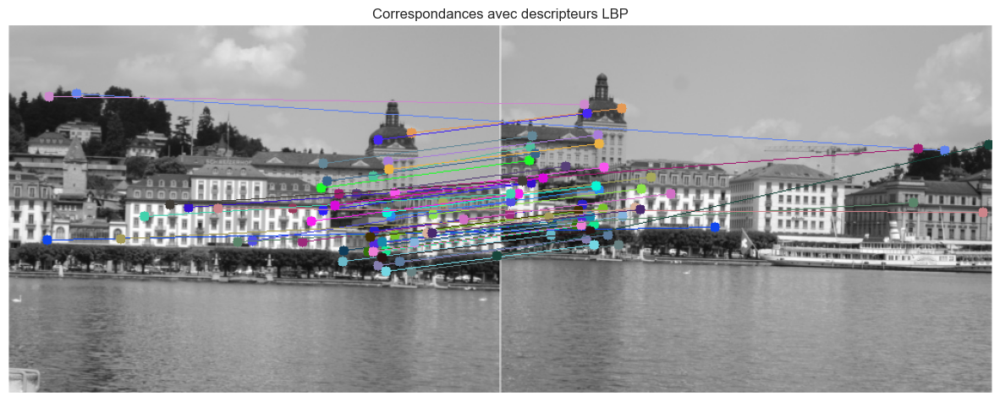

In [26]:
#affichage des correspondances LBP
canvas_lbp = display_matching(image1, image2, keypoints1_lbp, keypoints2_lbp, matches_lbp, nbp=50)
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(canvas_lbp, cv2.COLOR_BGR2RGB))
plt.title('Correspondances avec descripteurs LBP')
plt.axis('off')
plt.show()

### Interprétations : 

Nous avons à présent un autre descripteur avancé basé sur le LPB (Local Binary Patterns), cette fois ci combiné avec le détecteur FAST pour améliorer la description des points d’intérêt. Le LBP est un choix adapté pour capturer des informations robustes aux variations d’éclairage. Après avoir détecté les points d’intérêt à l’aide de FAST dans les deux images, les descripteurs LBP ont été extraits pour un total de 883 points dans l’image 1 et 712 points dans l’image 2. Ils ont ensuite été comparé, comme pour la partie précédente, entre les deux images en utilisant une méthode de matching. Nous obtenons 148 correspondances. Un nombre bien plus important que la partie précédente où nous avions eu 37 correspondances. 

Nous pouvons voir dans l'illustration que le descripteur LBP offre une meilleure robustesse pour apparier des points dans des régions complexes ou texturées, en exploitant la richesse des motifs locaux. Donc nous supposons que LBP améliore la discrimination des points d’intérêt en réduisant les mauvais appariements, et donc la combinaison de FAST pour la détection et de LBP pour la description constitue une méthode efficace. 